In [1]:
# https://colab.research.google.com/github/caocao0525/ChromBERT/blob/main/colab/ChromBERT_on_Colab.ipynb

import numpy as np
import pandas as pd 
import css_utility_rnakato as crb
import matplotlib.pylab as plt
import seaborn as sns

In [2]:
# str1 = "up100000_down90000_stride2"
# str2 = "high_exp_vs_RPKM_log3_k4"
# preddir = f"predict_logscale_train30000_dev6000_notomitO/{str1}/{str2}/"
preddir = "./high_exp_vs_RPKM_log3_k4"

attnfile = f'{preddir}/atten.npy'
predfile = f'{preddir}/pred_results.npy'
devfile = f'{preddir}/dev.tsv'
# devfile = f"finetune_data_logscale_train30000_dev6000_notomitO//{str1}/{str2}/dev.tsv"

dev_mat = crb.dev_conv_rnakato(devfile, stride=1)
attention_mat_raw = np.load(attnfile)
attention_mat, token_lengths = crb.truncate_attention_by_token_length(dev_mat, attention_mat_raw)
prediction_mat = np.load(predfile)

attention_mat[:5]

array([[0.00332439, 0.00305368, 0.00341072, ..., 0.        , 0.        ,
        0.        ],
       [0.00666451, 0.00710797, 0.00700617, ..., 0.        , 0.        ,
        0.        ],
       [0.00252935, 0.00209669, 0.00196701, ..., 0.        , 0.        ,
        0.        ],
       [0.00389804, 0.00427901, 0.00459476, ..., 0.        , 0.        ,
        0.        ],
       [0.01793183, 0.01360548, 0.01303046, ..., 0.        , 0.        ,
        0.        ]], shape=(5, 512))

array([0.24295297, 0.7015569 , 0.6208101 , ..., 0.19056009, 0.18460858,
       0.9888332 ], shape=(6000,), dtype=float32)

In [3]:
token_lengths[:5]

[474, 474, 474, 474, 474]

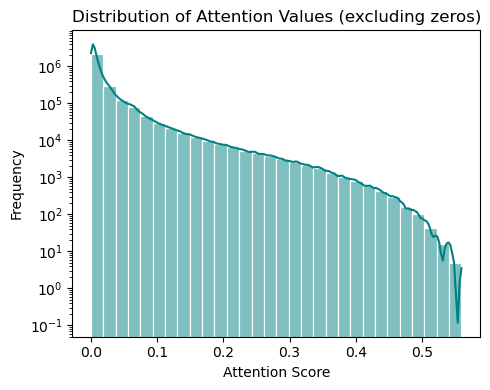

In [4]:
plt.figure(figsize=(5, 4))
sns.histplot(attention_mat[attention_mat != 0], bins=30, kde=True, color='teal', ec='white')
plt.xlabel("Attention Score")
plt.ylabel("Frequency")
plt.title("Distribution of Attention Values (excluding zeros)")
plt.yscale('log')
plt.tight_layout()
plt.show()

In [5]:
TP_idx, TN_idx, FP_idx, FN_idx = crb.get_confusion_index(prediction_path=predfile, dev_path=devfile)
print(TP_idx[:5])
print(TN_idx[:5])
print(FP_idx[:5])
print(FN_idx[:5])

[3 5 6 8 9]
[ 0  4  7 10 11]
[ 1  2 12 14 15]
[20 26 30 38 41]


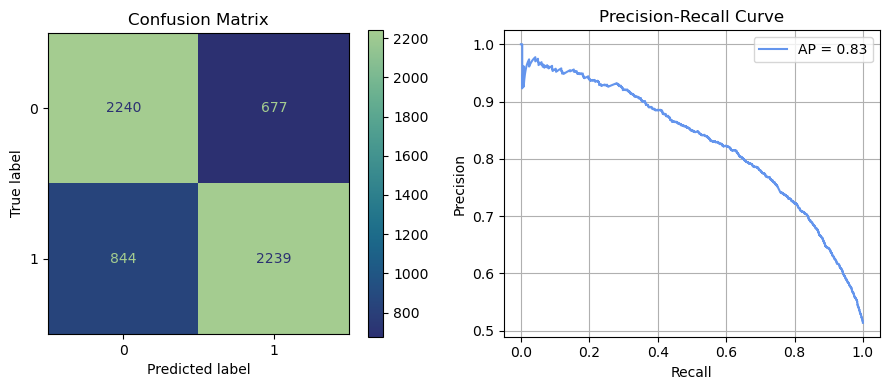

In [6]:
crb.plot_chrombert_eval(prediction_path=predfile, dev_path=devfile)

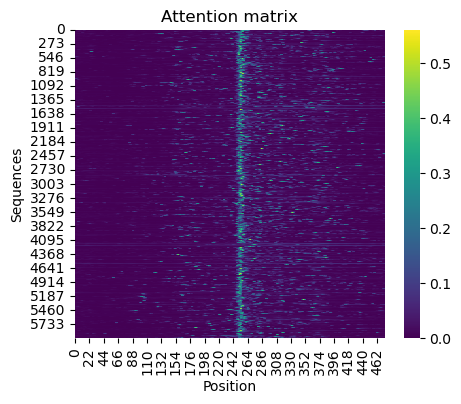

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(5, 4))
sns.heatmap(attention_mat[:,:474], cmap="viridis")
plt.title("Attention matrix")
plt.xlabel("Position")
plt.ylabel("Sequences");
plt.savefig("fig_temp/AttentionMatrix.pdf")

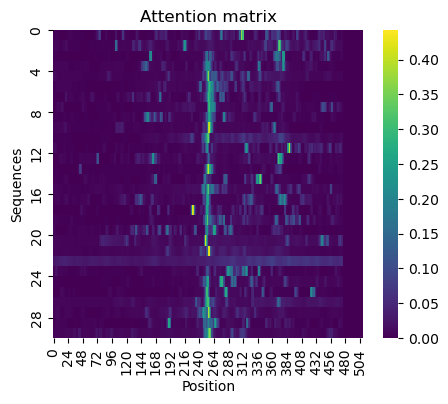

In [8]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# plt.figure(figsize=(5, 4))
# sns.heatmap(attention_mat[:30,:510], cmap="viridis")
# plt.title("Attention matrix")
# plt.xlabel("Position")
# plt.ylabel("Sequences");
# plt.savefig("fig_temp/AttentionMatrix.pdf")

import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(5, 4))

ax = sns.heatmap(attention_mat[:30, :510], cmap="viridis")

# Set ticks every 5 positions (adjust as you like)
# ax.set_xticks(range(0, 510, 5))
# ax.set_xticklabels(range(0, 510, 5))

ax.set_yticks(range(0, 31, 4))
ax.set_yticklabels(range(0, 31, 4))

plt.title("Attention matrix")
plt.xlabel("Position")
plt.ylabel("Sequences")

plt.savefig("fig_temp/AttentionMatrix.pdf")


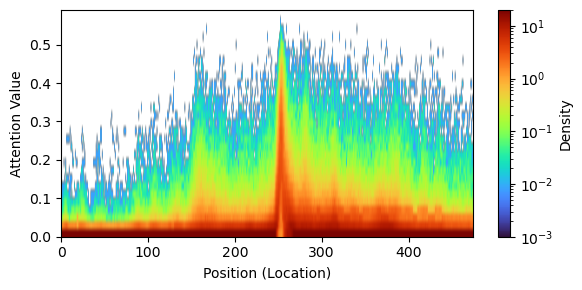

In [9]:
# attention_mat: (num_seq, num_pos)
from matplotlib.colors import LogNorm

bins = np.linspace(0, 1, 50)
hist2d = np.array([
    np.histogram(attention_mat[:, i], bins=bins, density=True)[0]
    for i in range(attention_mat.shape[1])]).T

plt.figure(figsize=(6, 3))
plt.imshow(hist2d, aspect='auto', cmap='turbo', origin='lower', extent=[0, attention_mat.shape[1], bins[0], bins[-1]], 
          norm=LogNorm(vmin=1e-3, vmax=20) )
plt.colorbar(label='Density')
plt.xlim(0, 474)
plt.ylim(0, 0.59)
plt.xlabel("Position (Location)")
plt.ylabel("Attention Value")
plt.tight_layout()
plt.savefig("fig_temp/AttentionMatrixDist_logscale.pdf")

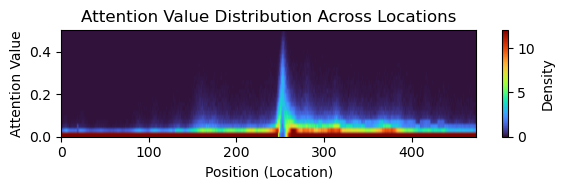

In [10]:
# attention_mat: (num_seq, num_pos)
from matplotlib.colors import LogNorm

bins = np.linspace(0, 1, 50)
hist2d = np.array([
    np.histogram(attention_mat[:, i], bins=bins, density=True)[0]
    for i in range(attention_mat.shape[1])]).T

plt.figure(figsize=(6, 2))
plt.imshow(hist2d[:474], aspect='auto', cmap='turbo', origin='lower', extent=[0, attention_mat.shape[1], bins[0], bins[-1]], 
          vmax=12)
plt.colorbar(label='Density')
plt.xlim(0, 474)
plt.ylim(0, 0.5)
plt.xlabel("Position (Location)")
plt.ylabel("Attention Value")
plt.title("Attention Value Distribution Across Locations")
plt.tight_layout()
plt.savefig("fig_temp/AttentionMatrixDist.pdf")

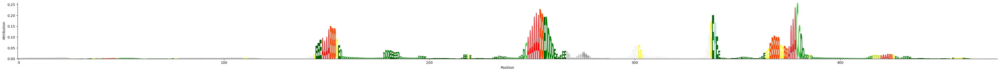

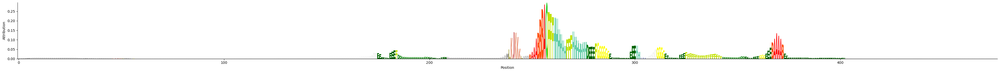

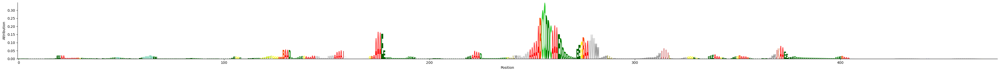

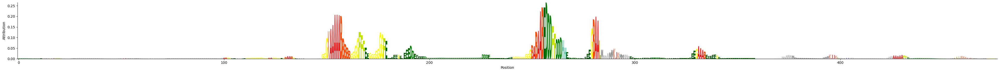

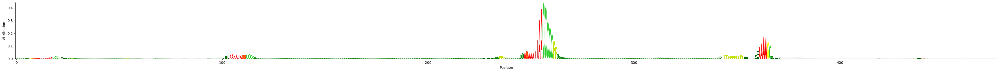

...

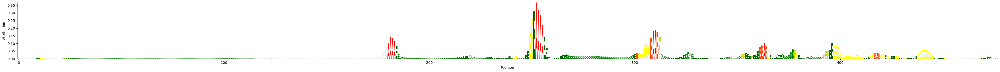

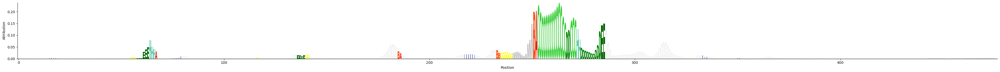

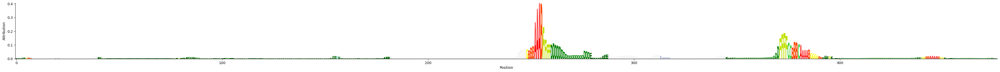

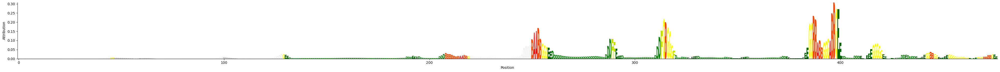

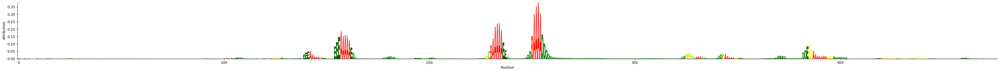

In [14]:
for id in TP_idx[:20]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}.pdf", xsize=40)

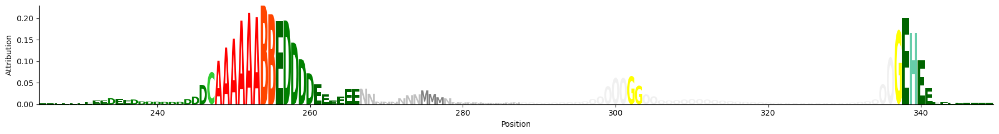

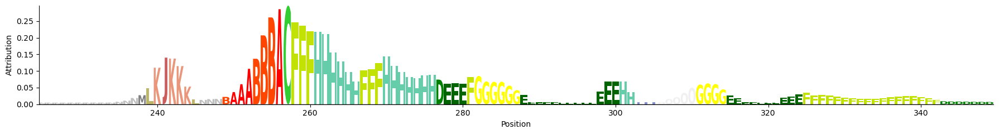

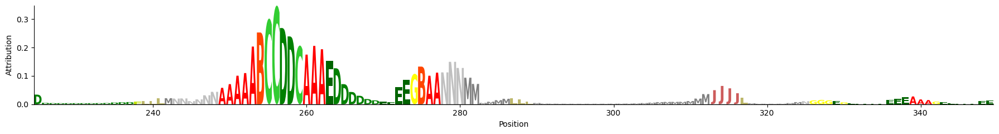

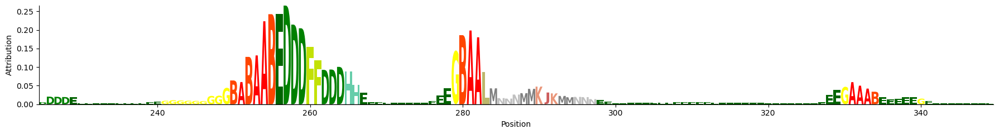

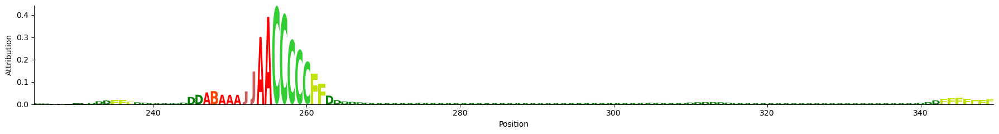

In [ ]:
for id in TP_idx[:5]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}_adj.pdf", xsize=18, ysize=2.5,range_=range(225,350))

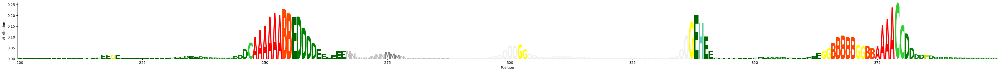

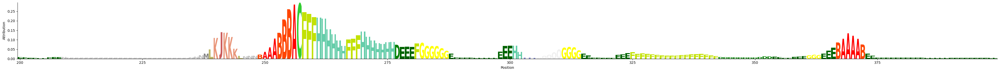

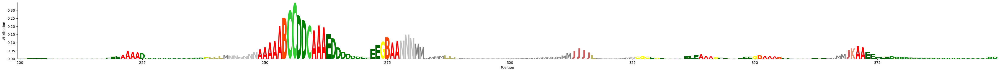

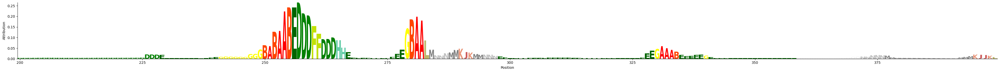

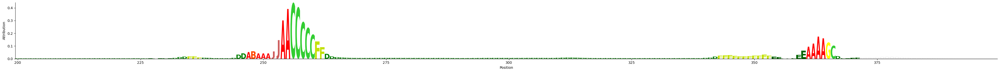

...

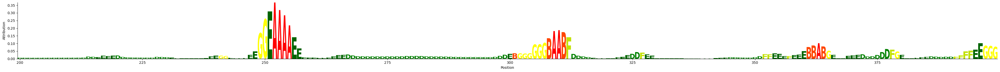

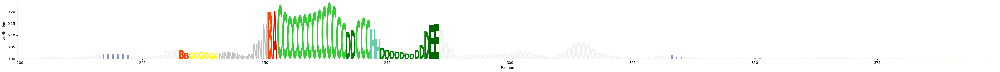

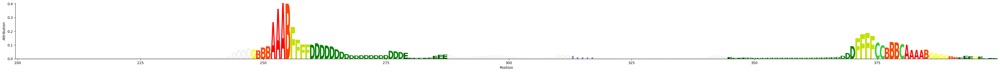

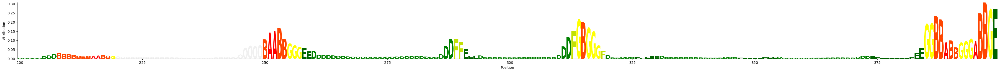

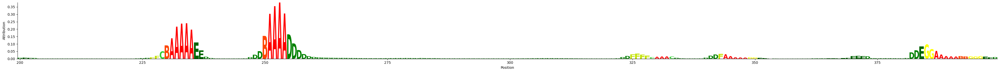

In [15]:
for id in TP_idx[:20]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}-200-400.pdf", xsize=40, range_=range(200,400))

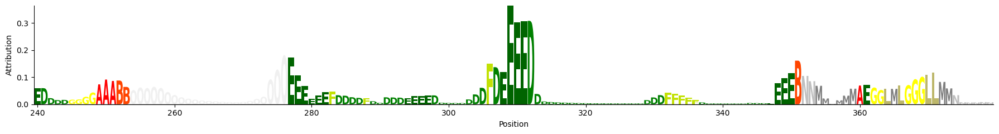

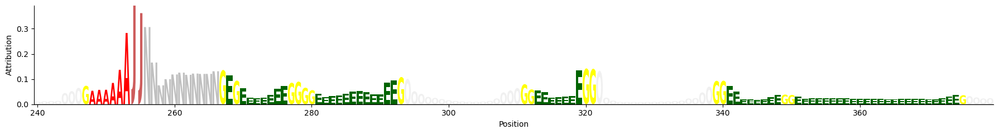

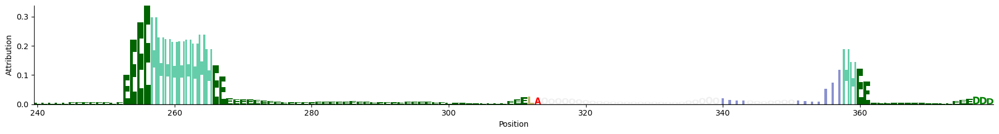

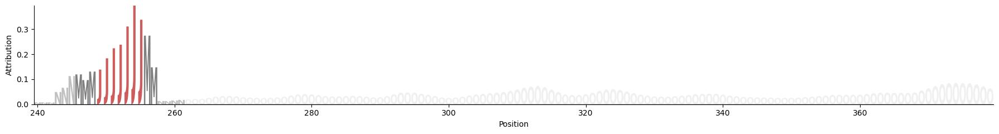

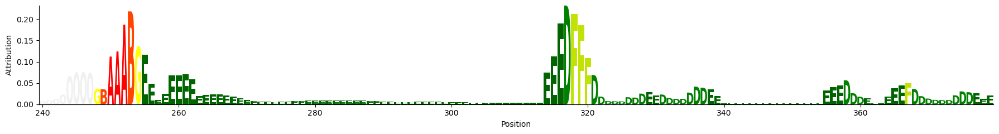

In [51]:
for id in TN_idx[:5]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}_adj.pdf", xsize=18, ysize=2.5,range_=range(240,380))

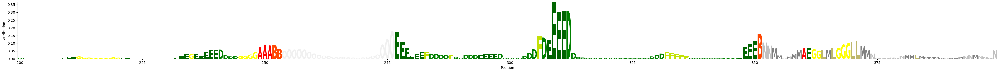

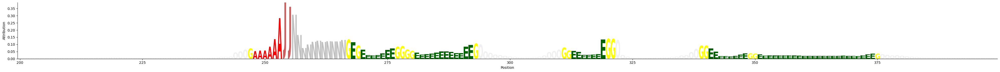

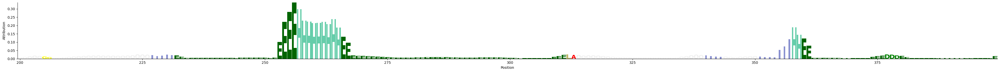

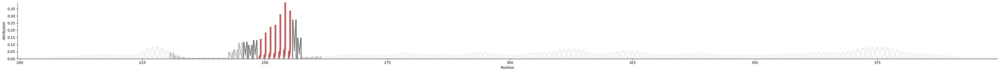

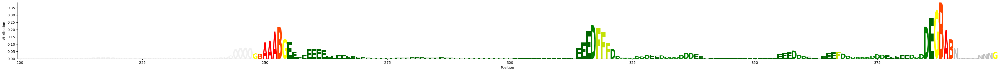

...

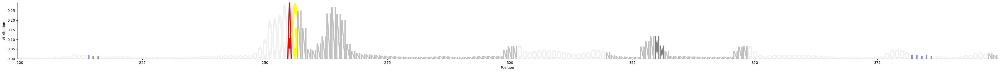

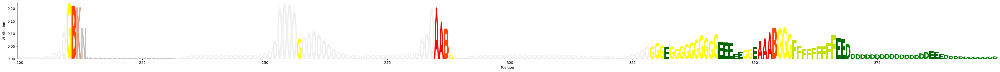

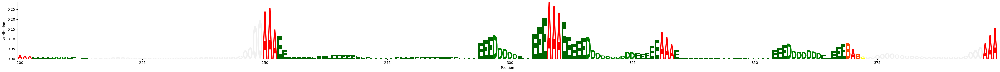

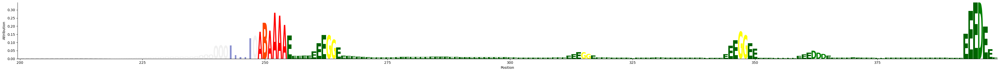

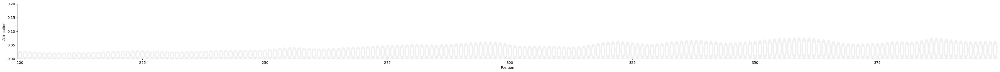

In [17]:
for id in TN_idx[:20]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}-200-400.pdf", xsize=40, range_=range(200,400))

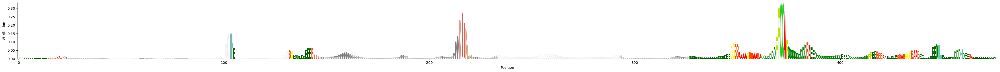

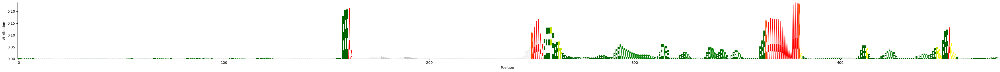

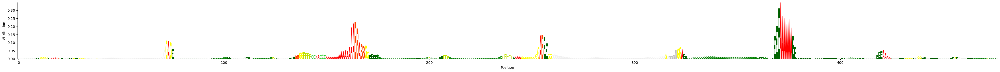

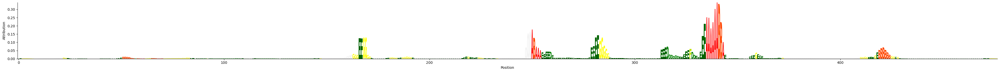

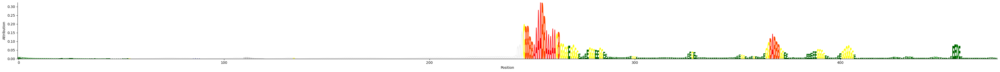

...

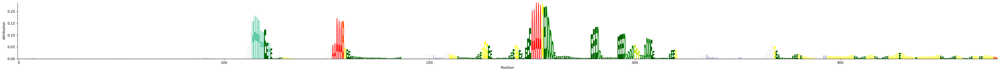

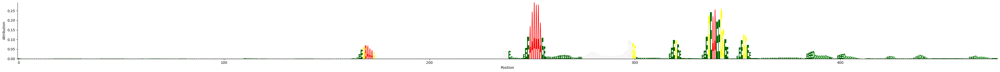

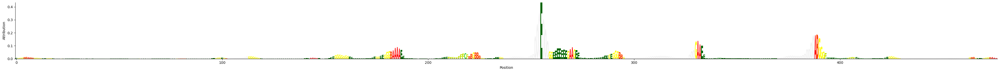

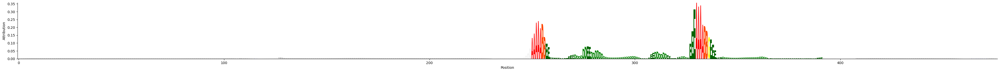

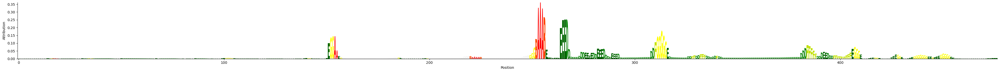

In [18]:
for id in FP_idx[:20]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}.pdf", xsize=40)

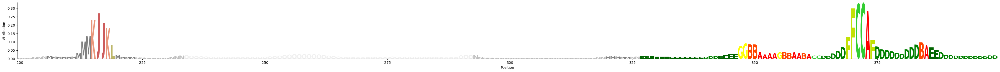

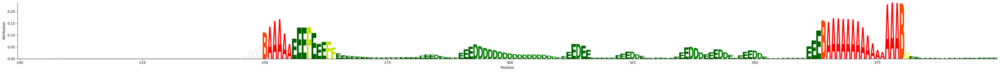

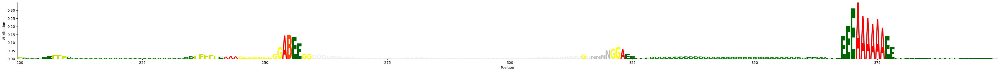

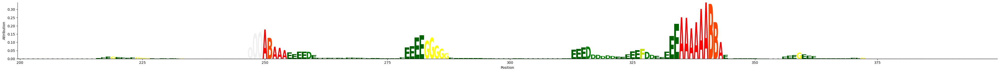

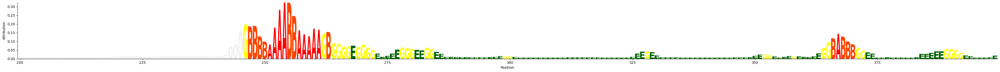

...

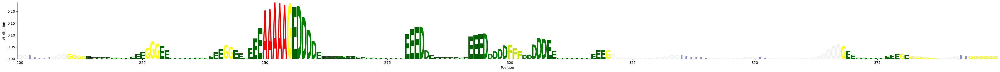

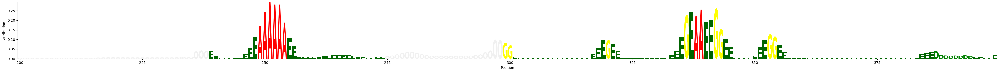

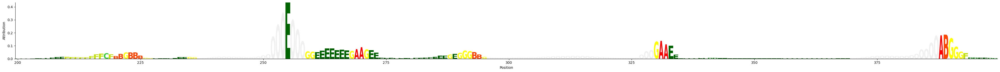

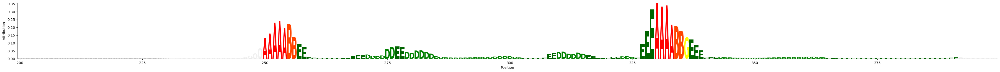

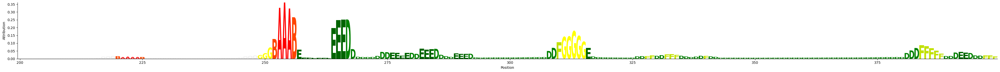

In [19]:
for id in FP_idx[:20]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}-200-400.pdf", xsize=40, range_=range(200,400))

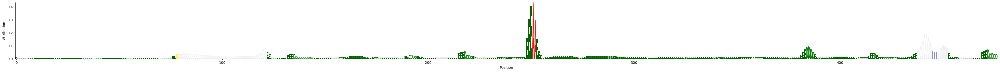

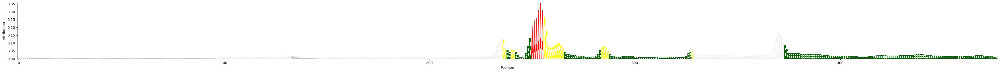

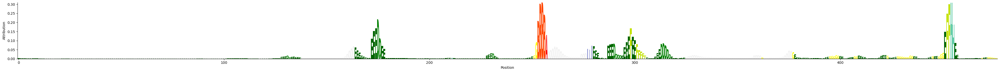

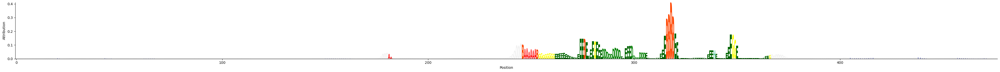

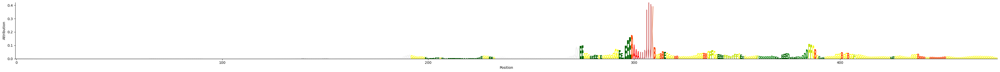

...

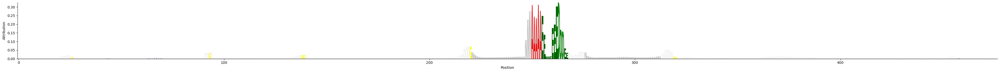

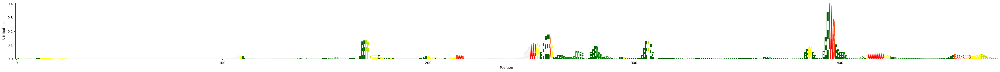

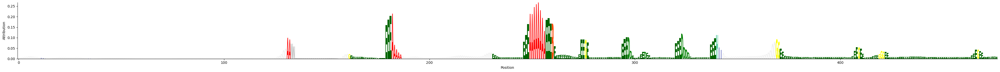

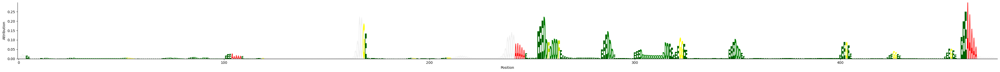

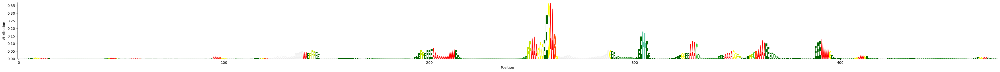

In [20]:
for id in FN_idx[:20]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}.pdf", xsize=40)

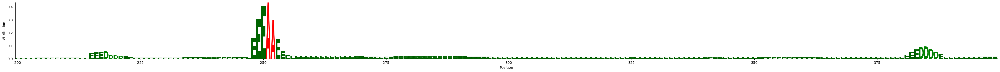

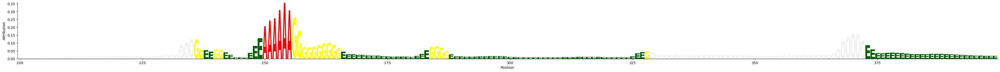

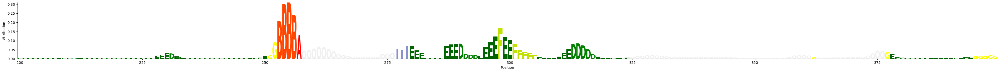

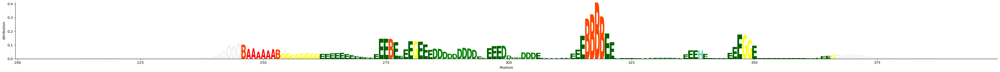

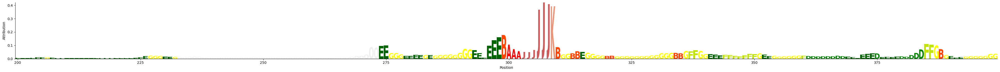

...

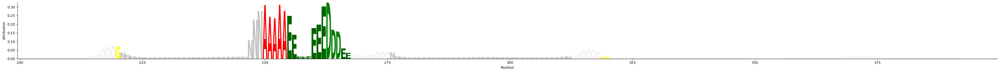

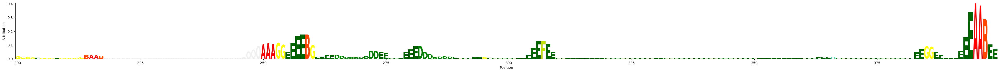

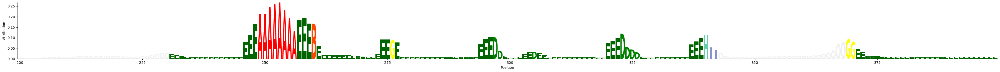

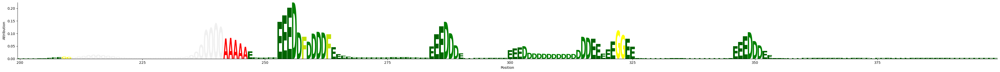

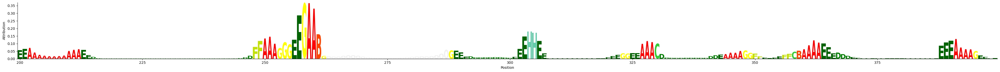

In [21]:
for id in FN_idx[:20]:
    crb.logo_from_dev_attention(dev_mat, attention_mat, id, f"fig_temp/{id}-200-400.pdf", xsize=40, range_=range(200,400))